***
INITIALIZATION
***

In [4]:
import findspark
findspark.init()

from pyspark.sql import SparkSession
#from pyspark import SparkContext, SparkConf

spark = SparkSession.builder \
.master("local") \
.appName("ActionApplication") \
.getOrCreate()

22/05/08 14:10:36 WARN Utils: Your hostname, DESKTOP-LL9VBG5 resolves to a loopback address: 127.0.1.1; using 192.168.32.22 instead (on interface eth0)
22/05/08 14:10:36 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
22/05/08 14:10:36 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
Using Spark's default log4j profile: org/apache/spark/log4j-defaults.properties
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).


In [1]:
from pyspark.sql import functions as F
import geopandas
import geoplot as gplt

In [2]:
bound = geopandas.read_file('./maps/MoCo_boundary/MoCo_boundary.shp').to_crs(epsg=4326)

In [ ]:
#https://data.montgomerycountymd.gov/Public-Safety/Traffic-Violations/4mse-ku6q
#https://www.kaggle.com/datasets/felix4guti/traffic-violations-in-usa

***
FIRST CLEANUP ON OG VIOLATION DATA
***

In [108]:
niceviolations = spark.read.csv("./Traffic_Violations/Traffic_Violations.csv", header=True, inferSchema=True)

In [109]:
#Dropping spaces for consistency, might be useful for direct calling. Not a function since the modern dataset has different columns, this ain't a program.

niceviolations = niceviolations.na.drop()
niceviolations = niceviolations.withColumn("TimeOfStop",F.col("Time Of Stop")).drop("Time Of Stop")
niceviolations = niceviolations.withColumn("DateOfStop",F.col("Date Of Stop")).drop("Date Of Stop")
niceviolations = niceviolations.withColumn("PersonalInjury",F.col("Personal Injury")).drop("Personal Injury")
niceviolations = niceviolations.withColumn("PropertyDamage",F.col("Property Damage")).drop("Property Damage")
niceviolations = niceviolations.withColumn("CommercialLicense",F.col("Commercial License")).drop("Commercial License")
niceviolations = niceviolations.withColumn("CommercialVehicle",F.col("Commercial Vehicle")).drop("Commercial Vehicle")
niceviolations = niceviolations.withColumn("WorkZone",F.col("Work Zone")).drop("Work Zone")
niceviolations = niceviolations.withColumn("ContributedToAccident",F.col("Contributed To Accident")).drop("Contributed To Accident")
niceviolations = niceviolations.withColumn("DriverCity",F.col("Driver City")).drop("Driver City")
niceviolations = niceviolations.withColumn("DriverState",F.col("Driver State")).drop("Driver State")
niceviolations = niceviolations.withColumn("DLState",F.col("DL State")).drop("DL State")
niceviolations = niceviolations.withColumn("ArrestType",F.col("Arrest Type")).drop("Arrest Type")



In [110]:
niceviolations.printSchema()

root
 |-- Agency: string (nullable = true)
 |-- SubAgency: string (nullable = true)
 |-- Description: string (nullable = true)
 |-- Location: string (nullable = true)
 |-- Latitude: string (nullable = true)
 |-- Longitude: string (nullable = true)
 |-- Accident: string (nullable = true)
 |-- Belts: string (nullable = true)
 |-- Fatal: string (nullable = true)
 |-- HAZMAT: string (nullable = true)
 |-- Alcohol: string (nullable = true)
 |-- State: string (nullable = true)
 |-- VehicleType: string (nullable = true)
 |-- Year: string (nullable = true)
 |-- Make: string (nullable = true)
 |-- Model: string (nullable = true)
 |-- Color: string (nullable = true)
 |-- Violation Type: string (nullable = true)
 |-- Charge: string (nullable = true)
 |-- Article: string (nullable = true)
 |-- Race: string (nullable = true)
 |-- Gender: string (nullable = true)
 |-- Geolocation: string (nullable = true)
 |-- TimeOfStop: string (nullable = true)
 |-- DateOfStop: string (nullable = true)
 |-- Person

In [111]:
#Weekday, Hour added, type conversions
niceviolations = niceviolations.withColumn("DateTime", F.concat_ws('-',niceviolations.DateOfStop,niceviolations.TimeOfStop))
niceviolations = niceviolations.withColumn("DateTime",F.to_timestamp(F.col('DateTime'), 'MM/dd/yyyy-HH:mm:ss'))
niceviolations = niceviolations.withColumn("WeekDay",F.dayofweek(niceviolations.DateTime).cast("integer"))
niceviolations = niceviolations.withColumn("Hour",F.hour(niceviolations.DateTime).cast("integer"))
niceviolations = niceviolations.withColumn("Latitude",F.col("Latitude").cast("float"))
niceviolations = niceviolations.withColumn("Longitude",F.col("Longitude").cast("float"))


In [112]:
niceviolations.count()

877055

In [113]:
#BEFORE GROUPING FIX APPROX. VALUES
niceviolations = niceviolations.withColumn("Latitude",F.col("Latitude").cast("float"))
niceviolations = niceviolations.withColumn("Longitude",F.col("Longitude").cast("float"))
niceviolations = niceviolations.where(F.col("Latitude") >= 30).where(F.col("Longitude") <= -70)

In [114]:
niceviolations.printSchema()

root
 |-- Agency: string (nullable = true)
 |-- SubAgency: string (nullable = true)
 |-- Description: string (nullable = true)
 |-- Location: string (nullable = true)
 |-- Latitude: float (nullable = true)
 |-- Longitude: float (nullable = true)
 |-- Accident: string (nullable = true)
 |-- Belts: string (nullable = true)
 |-- Fatal: string (nullable = true)
 |-- HAZMAT: string (nullable = true)
 |-- Alcohol: string (nullable = true)
 |-- State: string (nullable = true)
 |-- VehicleType: string (nullable = true)
 |-- Year: string (nullable = true)
 |-- Make: string (nullable = true)
 |-- Model: string (nullable = true)
 |-- Color: string (nullable = true)
 |-- Violation Type: string (nullable = true)
 |-- Charge: string (nullable = true)
 |-- Article: string (nullable = true)
 |-- Race: string (nullable = true)
 |-- Gender: string (nullable = true)
 |-- Geolocation: string (nullable = true)
 |-- TimeOfStop: string (nullable = true)
 |-- DateOfStop: string (nullable = true)
 |-- Personal

***
AUTOCONVERT Y/N COLS TO BOOLEAN
***

In [115]:
#https://hadoopist.wordpress.com/2016/08/05/spark-data-frame-check-for-any-column-values-with-n-and-y-and-convert-the-corresponding-column-to-boolean-using-pyspark/

#Alternatively cast col types one at a time. Found this looking for inbuilt batch cast possibilities. REALLY SLOW.

for a_dftype in niceviolations.dtypes:
    col_name = a_dftype[0]
    col_type = a_dftype[1]
    
    if col_type=='string' and (niceviolations.select(col_name).distinct().collect()[0][0] =='No' or niceviolations.select(col_name).distinct().collect()[0][0] =='Yes'):
      niceviolations = niceviolations.withColumn(col_name,niceviolations[col_name].cast("boolean")).drop(niceviolations[col_name])
    else:
      niceviolations = niceviolations.withColumn(col_name,niceviolations[col_name]).drop(niceviolations[col_name])
print(niceviolations.head())
niceviolations.printSchema()

Row(Agency='MCP', SubAgency='2nd district, Bethesda', Description='DRIVING WHILE IMPAIRED BY ALCOHOL', Location='NORFOLK AVE /  ST ELMO AVE', Latitude=38.983577728271484, Longitude=-77.09310150146484, Accident=False, Belts=False, Fatal=False, HAZMAT=False, Alcohol=False, State='MD', VehicleType='02 - Automobile', Year='2005', Make='AUDI', Model='4S', Color='GRAY', Violation Type='Citation', Charge='21-902(b1)', Article='Transportation Article', Race='WHITE', Gender='M', Geolocation='(38.9835782, -77.09310515)', TimeOfStop='00:41:00', DateOfStop='12/20/2012', PersonalInjury=False, PropertyDamage=False, CommercialLicense=False, CommercialVehicle=False, WorkZone=False, ContributedToAccident=False, DriverCity='DERWOOD', DriverState='MD', DLState='MD', ArrestType='A - Marked Patrol', DateTime=datetime.datetime(2012, 12, 20, 0, 41), WeekDay=5, Hour=0)
root
 |-- Agency: string (nullable = true)
 |-- SubAgency: string (nullable = true)
 |-- Description: string (nullable = true)
 |-- Location: 

In [118]:
#ADD ALCOHOL COLUMN
niceviolations = niceviolations.withColumn("AlcoholPresent", F.when(F.col("Description").like('%ALC%'), 1).otherwise(0))

***
GROUP EM
***

In [120]:
#Group each stop, regardless of violation count
groupedniceviolations = niceviolations.select("*").groupBy("Agency", "SubAgency", "Location","Latitude","Longitude","Belts","PersonalInjury","PropertyDamage","Fatal","CommercialVehicle","HAZMAT","WorkZone","State","VehicleType","Year","Make","Model","Color","DriverCity","DriverState","Geolocation","WeekDay","Hour").max("AlcoholPresent")

In [121]:
groupedniceviolations.printSchema()

root
 |-- Agency: string (nullable = true)
 |-- SubAgency: string (nullable = true)
 |-- Location: string (nullable = true)
 |-- Latitude: float (nullable = true)
 |-- Longitude: float (nullable = true)
 |-- Belts: boolean (nullable = true)
 |-- PersonalInjury: boolean (nullable = true)
 |-- PropertyDamage: boolean (nullable = true)
 |-- Fatal: boolean (nullable = true)
 |-- CommercialVehicle: boolean (nullable = true)
 |-- HAZMAT: boolean (nullable = true)
 |-- WorkZone: boolean (nullable = true)
 |-- State: string (nullable = true)
 |-- VehicleType: string (nullable = true)
 |-- Year: string (nullable = true)
 |-- Make: string (nullable = true)
 |-- Model: string (nullable = true)
 |-- Color: string (nullable = true)
 |-- DriverCity: string (nullable = true)
 |-- DriverState: string (nullable = true)
 |-- Geolocation: string (nullable = true)
 |-- WeekDay: integer (nullable = true)
 |-- Hour: integer (nullable = true)
 |-- max(AlcoholPresent): integer (nullable = true)



In [122]:
groupedniceviolations.count()

509639

In [101]:
#Group each stop, regardless of violation count, avg to get a dataframe out
groupedniceviolations = niceviolations.select("*").groupBy("Agency", "SubAgency", "Location","Latitude","Longitude", "Accident","Belts","PersonalInjury","PropertyDamage","Fatal","CommercialVehicle","HAZMAT","Alcohol","WorkZone","State","VehicleType","Year","Make","Model","Color","ContributedToAccident","Race","Gender","DriverCity","DriverState","ArrestType","Geolocation","WeekDay","Hour").avg()

In [123]:
groupedniceviolations = groupedniceviolations.withColumn("AlcoholPresent",F.col("max(AlcoholPresent)").cast('boolean')).drop("max(AlcoholPresent)")

In [124]:
groupedniceviolations.printSchema()

root
 |-- Agency: string (nullable = true)
 |-- SubAgency: string (nullable = true)
 |-- Location: string (nullable = true)
 |-- Latitude: float (nullable = true)
 |-- Longitude: float (nullable = true)
 |-- Belts: boolean (nullable = true)
 |-- PersonalInjury: boolean (nullable = true)
 |-- PropertyDamage: boolean (nullable = true)
 |-- Fatal: boolean (nullable = true)
 |-- CommercialVehicle: boolean (nullable = true)
 |-- HAZMAT: boolean (nullable = true)
 |-- WorkZone: boolean (nullable = true)
 |-- State: string (nullable = true)
 |-- VehicleType: string (nullable = true)
 |-- Year: string (nullable = true)
 |-- Make: string (nullable = true)
 |-- Model: string (nullable = true)
 |-- Color: string (nullable = true)
 |-- DriverCity: string (nullable = true)
 |-- DriverState: string (nullable = true)
 |-- Geolocation: string (nullable = true)
 |-- WeekDay: integer (nullable = true)
 |-- Hour: integer (nullable = true)
 |-- AlcoholPresent: boolean (nullable = true)



In [35]:
#Fun write options for sanity checking the dataframe vals

#niceviolations.repartition(1).write.option("header",True).csv("./goodtimes")
#niceviolations.write.option("header",True).csv("./goodtimes")

In [40]:
#Loading the same

#niceviolations = spark.read.csv("./goodtimes",header=True, inferSchema=True)

***
PREPROCESS AND GROUP MONTY VIOLATIONS
***

In [147]:
monty = spark.read.csv('./Traffic_Violations/MontyTraffic_Violations.csv', header=True, inferSchema=True)

In [137]:
monty.count()

1788618

In [133]:
monty.printSchema()

root
 |-- SeqID: string (nullable = true)
 |-- Agency: string (nullable = true)
 |-- SubAgency: string (nullable = true)
 |-- Description: string (nullable = true)
 |-- Location: string (nullable = true)
 |-- Latitude: string (nullable = true)
 |-- Longitude: string (nullable = true)
 |-- Accident: string (nullable = true)
 |-- Belts: string (nullable = true)
 |-- Fatal: string (nullable = true)
 |-- HAZMAT: string (nullable = true)
 |-- Alcohol: string (nullable = true)
 |-- Search Conducted: string (nullable = true)
 |-- Search Disposition: string (nullable = true)
 |-- Search Outcome: string (nullable = true)
 |-- Search Reason: string (nullable = true)
 |-- Search Reason For Stop: string (nullable = true)
 |-- Search Type: string (nullable = true)
 |-- Search Arrest Reason: string (nullable = true)
 |-- State: string (nullable = true)
 |-- VehicleType: string (nullable = true)
 |-- Year: string (nullable = true)
 |-- Make: string (nullable = true)
 |-- Model: string (nullable = tru

In [155]:
monty = monty.drop('seqID').drop('Search Conducted').drop('Search Disposition').drop('Search Reason').drop('Search Type').drop('Search Reason For Stop').drop('Search Outcome').drop('Search Arrest Reason')

In [167]:
monty.count()

1690746

In [157]:
monty = monty.na.drop()
monty = monty.withColumn("TimeOfStop",F.col("Time Of Stop")).drop("Time Of Stop")
monty = monty.withColumn("DateOfStop",F.col("Date Of Stop")).drop("Date Of Stop")
monty = monty.withColumn("PersonalInjury",F.col("Personal Injury")).drop("Personal Injury")
monty = monty.withColumn("PropertyDamage",F.col("Property Damage")).drop("Property Damage")
monty = monty.withColumn("CommercialLicense",F.col("Commercial License")).drop("Commercial License")
monty = monty.withColumn("CommercialVehicle",F.col("Commercial Vehicle")).drop("Commercial Vehicle")
monty = monty.withColumn("WorkZone",F.col("Work Zone")).drop("Work Zone")
monty = monty.withColumn("ContributedToAccident",F.col("Contributed To Accident")).drop("Contributed To Accident")
monty = monty.withColumn("DriverCity",F.col("Driver City")).drop("Driver City")
monty = monty.withColumn("DriverState",F.col("Driver State")).drop("Driver State")
monty = monty.withColumn("DLState",F.col("DL State")).drop("DL State")
monty = monty.withColumn("ArrestType",F.col("Arrest Type")).drop("Arrest Type")

In [168]:
#Weekday, Hour added, type conversions
monty = monty.withColumn("DateTime", F.concat_ws('-',monty.DateOfStop,monty.TimeOfStop))
monty = monty.withColumn("DateTime",F.to_timestamp(F.col('DateTime'), 'MM/dd/yyyy-HH:mm:ss'))
monty = monty.withColumn("WeekDay",F.dayofweek(monty.DateTime).cast("integer"))
monty = monty.withColumn("Hour",F.hour(monty.DateTime).cast("integer"))
monty = monty.withColumn("Latitude",F.col("Latitude").cast("float"))
monty = monty.withColumn("Longitude",F.col("Longitude").cast("float"))

In [186]:
monty = monty.where(F.year(monty.DateTime)>2016)

In [188]:
monty = monty.select("*").where(monty.Latitude > 1)
monty = monty.select("*").where(monty.Longitude < -1)

In [190]:
for a_dftype in monty.dtypes:
    col_name = a_dftype[0]
    col_type = a_dftype[1]
    
    if col_type=='string' and (monty.select(col_name).distinct().collect()[0][0] =='No' or monty.select(col_name).distinct().collect()[0][0] =='Yes'):
      monty = monty.withColumn(col_name,monty[col_name].cast("boolean")).drop(monty[col_name])
    else:
      monty = monty.withColumn(col_name,monty[col_name]).drop(monty[col_name])
print(monty.head())
monty.printSchema()

Row(Agency='MCP', SubAgency='2nd District, Bethesda', Description='LEAVING UNATTENDED VEH. W/O STOPPING ENGINE, LOCKING IGNITION, REMOVING KEY & SETTING BRAKE', Location='CORDELL ST @ NORFOLK AVE.', Latitude=38.989742279052734, Longitude=-77.09777069091797, Accident=False, Belts=False, Fatal=False, HAZMAT=False, Alcohol=False, State='MD', VehicleType='02 - Automobile', Year='2016', Make='TOYOTA', Model='CAMRY', Color='SILVER', Violation Type='Citation', Charge='21-1101(a)', Article='Transportation Article', Race='BLACK', Gender='M', Geolocation='(38.9897433333333, -77.09777)', TimeOfStop='20:02:00', DateOfStop='08/11/2019', PersonalInjury=False, PropertyDamage=False, CommercialLicense=False, CommercialVehicle=False, WorkZone=False, ContributedToAccident='False', DriverCity='SILVER SPRING', DriverState='MD', DLState='MD', ArrestType='A - Marked Patrol', DateTime=datetime.datetime(2019, 8, 11, 20, 2), WeekDay=1, Hour=20)
root
 |-- Agency: string (nullable = true)
 |-- SubAgency: string (

In [192]:
#Alcohol Column
monty = monty.withColumn("AlcoholPresent", F.when(F.col("Description").like('%ALC%'), 1).otherwise(0))

***
GROUP AGAIN
***

In [193]:
groupedmonty = monty.select("*").groupBy("Agency", "SubAgency", "Location","Latitude","Longitude","Belts","PersonalInjury","PropertyDamage","Fatal","CommercialVehicle","HAZMAT","WorkZone","State","VehicleType","Year","Make","Model","Color","DriverCity","DriverState","Geolocation","WeekDay","Hour").max("AlcoholPresent")

In [194]:
groupedmonty = groupedmonty.withColumn("AlcoholPresent",F.col("max(AlcoholPresent)").cast('boolean')).drop("max(AlcoholPresent)")

In [196]:
groupedmonty.head()

Row(Agency='MCP', SubAgency='3rd District, Silver Spring', Location='NEW HAMPSHIRE AVENUE/CHALMERS RD', Latitude=39.028472900390625, Longitude=-76.98294830322266, Belts=False, PersonalInjury=False, PropertyDamage=False, Fatal=False, CommercialVehicle=False, HAZMAT=False, WorkZone=False, State='MD', VehicleType='02 - Automobile', Year='2014', Make='HYUNDAI', Model='4D', Color='GRAY', DriverCity='BELTSVILLE', DriverState='MD', Geolocation='(39.0284733333333, -76.9829516666667)', WeekDay=2, Hour=22, AlcoholPresent=False)

In [197]:
print(groupedniceviolations.count())
print(niceviolations.count())
print(groupedmonty.count())
print(monty.count())

509639


876965


392807


[Stage 496:===============================================>         (5 + 1) / 6]

693848


***
SAVE EM IF NEEDED
***

In [198]:
niceviolations.write.option("header",True).csv("./violations")
monty.write.option("header",True).csv("./monty")

In [199]:
groupedniceviolations.write.option("header",True).csv("./groupviolations")
groupedmonty.write.option("header",True).csv("./groupmonty")

***
LOAD EM FOR THE NEXT PART
***

In [5]:
niceviolations = spark.read.csv("./violations",header=True, inferSchema=True)
monty = spark.read.csv("./monty",header=True, inferSchema=True)

In [8]:
tvg = spark.read.csv("./groupviolations",header=True, inferSchema=True)
mvg= spark.read.csv("./groupmonty",header=True, inferSchema=True)
#ALSO KNOWN AS GROUPEDNICEVIOLATIONS AND MONTYVIOLATIONS FOR THE NEXT PART

***
OLD DATA SANITY CHECKS
***

In [127]:
groupedniceviolations.select("*").where(F.col("AlcoholPresent")==True).count()/groupedniceviolations.count()

0.020349698512084045

In [106]:
niceviolations = niceviolations.withColumn("AlcoholPresent",F.col("AlcoholPresent").cast("integer"))

In [107]:
niceviolations.select("*").where(F.col("AlcoholPresent") == 1).count()

27903

In [90]:
groupedniceviolations.repartition(1).write.option("header",True).csv("./Whattaheck.csv")

In [84]:
monty = monty.withColumn("AlcoholPresent",F.col("AlcoholPresent").cast("integer"))

In [85]:
groupedmonty = monty.select("*").groupBy("Agency", "SubAgency", "Location","Latitude","Longitude","Belts","PersonalInjury","PropertyDamage","Fatal","CommercialVehicle","HAZMAT","WorkZone","State","VehicleType","Year","Make","Model","Color","DriverCity","DriverState","Geolocation","WeekDay","Hour").max("AlcoholPresent")

In [86]:
groupedmonty = groupedmonty.withColumn("AlcoholPresent",F.col("max(AlcoholPresent)")).drop("max(AlcoholPresent)")
groupedmonty = groupedmonty.withColumn("AlcoholPresent",F.col("AlcoholPresent").cast("boolean"))

In [87]:
groupedmonty.head()

Row(Agency='MCP', SubAgency='Headquarters and Special Operations', Location='LAYHILL RD @ GLENALLAN AVE', Latitude=39.070587, Longitude=-77.04526, Belts=False, PersonalInjury=False, PropertyDamage=False, Fatal=False, CommercialVehicle=False, HAZMAT=False, WorkZone=False, State='MD', VehicleType='05 - Light Duty Truck', Year=2013, Make='TOYT', Model='UT', Color='RED', DriverCity='SILVER SPRING', DriverState='MD', Geolocation='(39.0705866666667, -77.0452583333333)', WeekDay=3, Hour=8, AlcoholPresent=False)

In [89]:
groupedmonty.select("*").where(F.col("AlcoholPresent")==True).count()/groupedmonty.count()

0.0371483853586255

In [91]:
groupedmonty.repartition(1).write.option("header",True).csv("./Whattaheck.csv")

In [ ]:
print(groupedniceviolations.select("*").where(F.col("AlcoholPresent")==True).count()/groupedniceviolations.count())

In [93]:
#ALCOHOL STATS OVER ALL CITATIONS VS ALL STOPS FIRST ATT.
print(niceviolations.select("*").where(F.col("AlcoholPresent")==True).count()/niceviolations.count())
print(groupedniceviolations.select("*").where(F.col("AlcoholPresent")==True).count()/groupedniceviolations.count())
print(monty.select("*").where(F.col("AlcoholPresent")==True).count()/monty.count())
print(groupedmonty.select("*").where(F.col("AlcoholPresent")==True).count()/groupedmonty.count())

0.031820592209924906


0.020351695189652838


0.05186885371850031


[Stage 112:===================================================> (193 + 1) / 200]

0.0371483853586255


In [202]:
#ALCOHOL STATS OVER ALL CITATIONS VS ALL STOPS SECOND ATT.
print(niceviolations.select("*").where(F.col("AlcoholPresent")==True).count()/niceviolations.count())
print(groupedniceviolations.select("*").where(F.col("AlcoholPresent")==True).count()/groupedniceviolations.count())
print(monty.select("*").where(F.col("AlcoholPresent")==True).count()/monty.count())
print(groupedmonty.select("*").where(F.col("AlcoholPresent")==True).count()/groupedmonty.count())

0.0318176894174796


0.020349698512084045


0.0333041242462326


[Stage 532:==================================================>  (192 + 1) / 200]

0.021985351584875017


***
VISUALIZATION, STATS
***

***
INITIALIZATION
***

In [9]:
#Geopandas dataframes with geoplot-compatible geometry data derived from lat-long
gtvg = geopandas.GeoDataFrame(tvg.toPandas(), geometry=geopandas.points_from_xy(list(tvg.select('Longitude').toPandas()['Longitude']), list(tvg.select('Latitude').toPandas()['Latitude'])))
gmvg = geopandas.GeoDataFrame(mvg.toPandas(), geometry=geopandas.points_from_xy(list(mvg.select('Longitude').toPandas()['Longitude']), list(mvg.select('Latitude').toPandas()['Latitude'])))


In [14]:
#Contiguous usa data from geoplot, queriable for states
path = gplt.datasets.get_path("contiguous_usa")
contiguous_usa = geopandas.read_file(path)
contiguous_usa.head()

,state,adm1_code,population,geometry
0,Minnesota,USA-3514,5303925,"POLYGON ((-89.59941 48.01027, -89.48888 48.013..."
1,Montana,USA-3515,989415,"POLYGON ((-111.19419 44.56116, -111.29155 44.7..."
2,North Dakota,USA-3516,672591,"POLYGON ((-96.60136 46.35136, -96.53891 46.199..."
3,Idaho,USA-3518,1567582,"POLYGON ((-111.04973 44.48816, -111.05025 42.0..."
4,Washington,USA-3519,6724540,"POLYGON ((-116.99807 46.33017, -116.90653 46.1..."


In [85]:
#Standard long-lat format Montgomery County boundary shapefile, crs for projection

bound = geopandas.read_file('./maps/MoCo_boundary/MoCo_boundary.shp').to_crs(epsg=4326)

***
MAPS
***

In [43]:
bound.geometry

0    POLYGON ((-77.18949 38.96757, -77.18983 38.967...
Name: geometry, dtype: geometry

In [66]:
print(extent)
(list(bound.geometry.bounds.values[0]))

[-79.485995  37.93705  -75.048385  39.725663]


[array([-77.52750133,  38.93420929, -76.88790041,  39.35426487])]

<GeoAxesSubplot:>

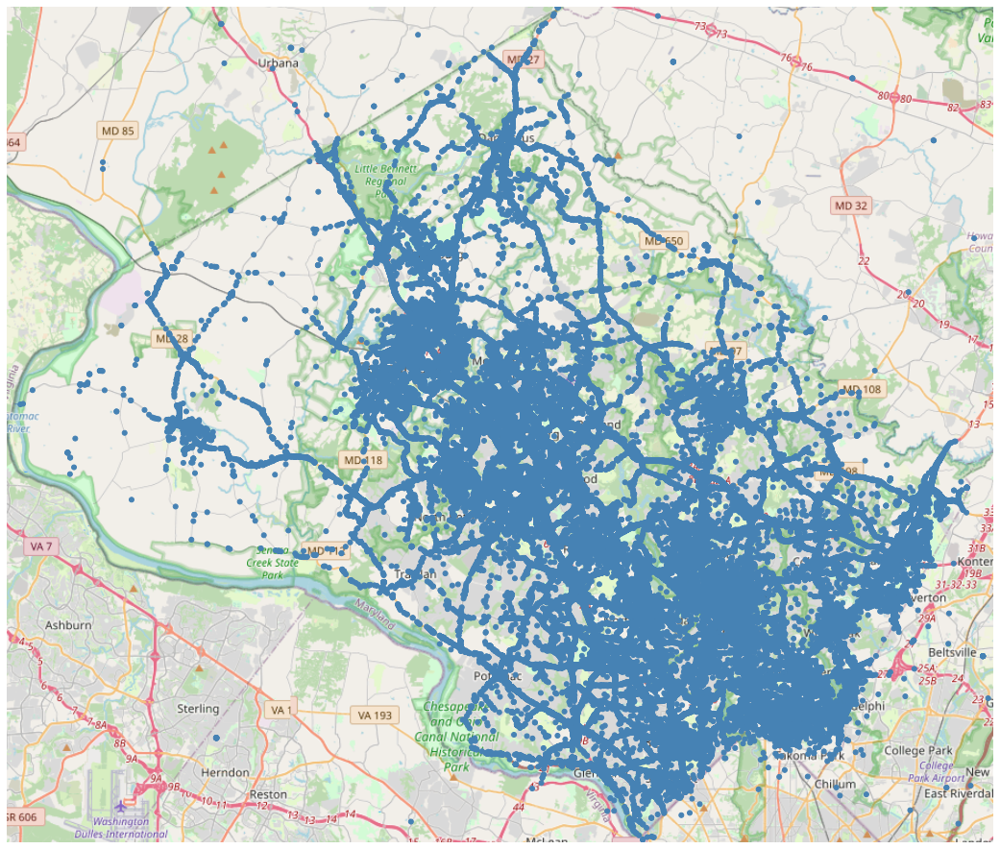

In [12]:
#extent = contiguous_usa.query('state == "Maryland"').total_bounds
#Get min max values from Montgomery County bounds
extent = (list(bound.geometry.bounds.values[0]))

ax = gplt.webmap(bound,
                 projection=gplt.crs.WebMercator(),
                 figsize=(24, 16),
                 extent=extent)

gplt.pointplot(
    gtvg,
    ax=ax,
    extent=extent,
    #hue="ELEV_IN_FT",
    #cmap="Blues",
    #scheme="quantiles",
    #scale="ELEV_IN_FT",
    limits=(0.1, 0.5)
    #legend=False,
    #legend_var="scale",
    #legend_kwargs={"frameon": False},
    #legend_values=[-110, 1750, 3600, 5500, 7400],
    #legend_labels=["-110 feet", "1750 feet", "3600 feet", "5500 feet", "7400 feet"]
)

<GeoAxesSubplot:>

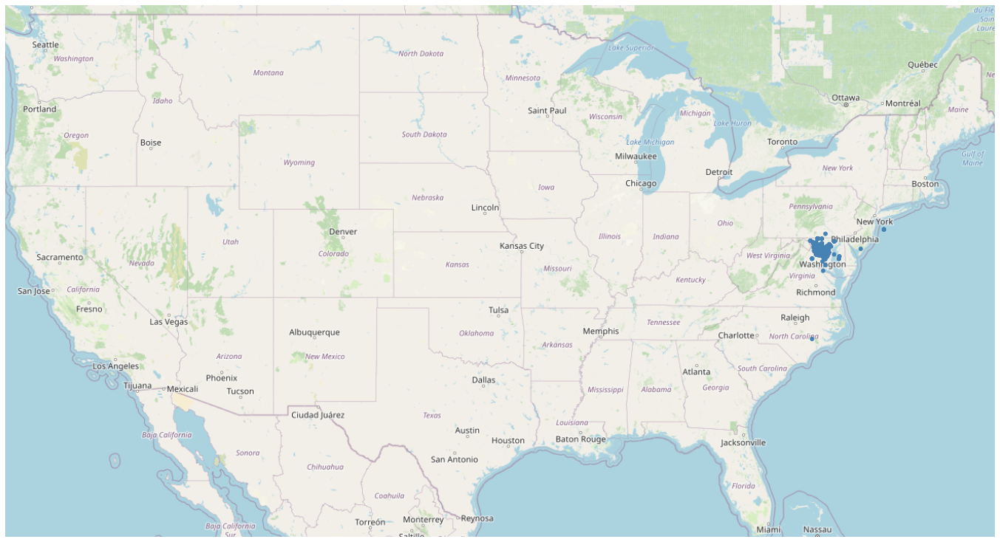

In [15]:
#extent = (list(bound.geometry.bounds.values[0]))

ax = gplt.webmap(contiguous_usa,
                 projection=gplt.crs.WebMercator(),
                 figsize=(24, 16),
                 extent=contiguous_usa.total_bounds)

gplt.pointplot(
    gtvg,
    ax=ax,
    extent=contiguous_usa.total_bounds,
    #hue="ELEV_IN_FT",
    #cmap="Blues",
    #scheme="quantiles",
    #scale="ELEV_IN_FT",
    limits=(0.1, 0.5)
    #legend=False,
    #legend_var="scale",
    #legend_kwargs={"frameon": False},
    #legend_values=[-110, 1750, 3600, 5500, 7400],
    #legend_labels=["-110 feet", "1750 feet", "3600 feet", "5500 feet", "7400 feet"]
)

<GeoAxesSubplot:>

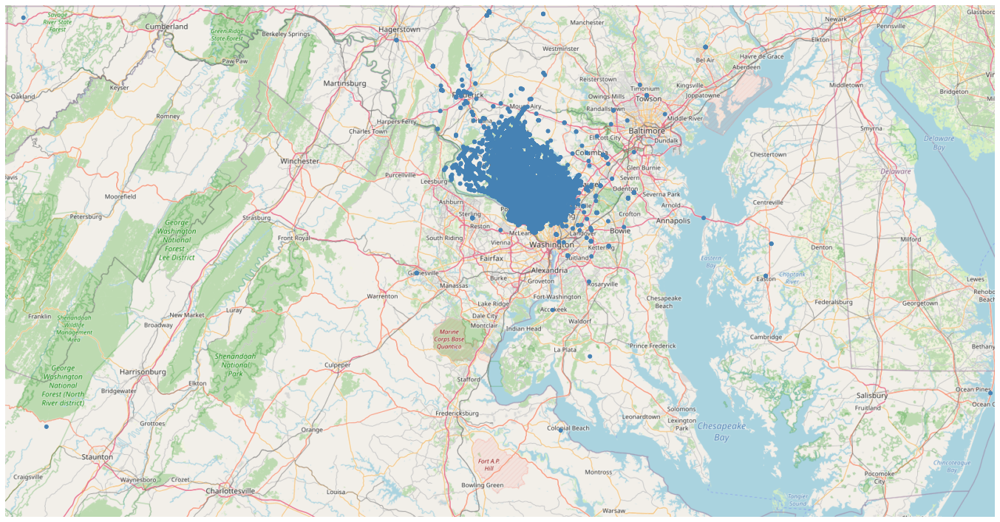

In [70]:
extent = contiguous_usa.query('state == "Maryland"').total_bounds
#Get min max values from Montgomery County bounds
#extent = (list(bound.geometry.bounds.values[0]))

ax = gplt.webmap(contiguous_usa,
                 projection=gplt.crs.WebMercator(),
                 figsize=(24, 16),
                 extent=extent)

gplt.pointplot(
    gtvg,
    ax=ax,
    extent=extent,
    #hue="ELEV_IN_FT",
    #cmap="Blues",
    #scheme="quantiles",
    #scale="ELEV_IN_FT",
    limits=(1, 2)
    #legend=False,
    #legend_var="scale",
    #legend_kwargs={"frameon": False},
    #legend_values=[-110, 1750, 3600, 5500, 7400],
    #legend_labels=["-110 feet", "1750 feet", "3600 feet", "5500 feet", "7400 feet"]
)

***
ONLY FOR ALCOHOL + ANIMATION
***

In [17]:
ALCtvg = tvg.where(F.col("AlcoholPresent")==True)
ALCmvg = mvg.where(F.col("AlcoholPresent")==True)

In [18]:
ALCtvg = ALCtvg.withColumn("OldData",F.lit(1))
ALCmvg = ALCmvg.withColumn("OldData",F.lit(2))

In [19]:
ALCgtvg = geopandas.GeoDataFrame(ALCtvg.toPandas(), geometry=geopandas.points_from_xy(list(ALCtvg.select('Longitude').toPandas()['Longitude']), list(ALCtvg.select('Latitude').toPandas()['Latitude'])))
ALCgmvg = geopandas.GeoDataFrame(ALCmvg.toPandas(), geometry=geopandas.points_from_xy(list(ALCmvg.select('Longitude').toPandas()['Longitude']), list(ALCmvg.select('Latitude').toPandas()['Latitude'])))

Text(0.5, 1.0, 'Drunk Drivers')

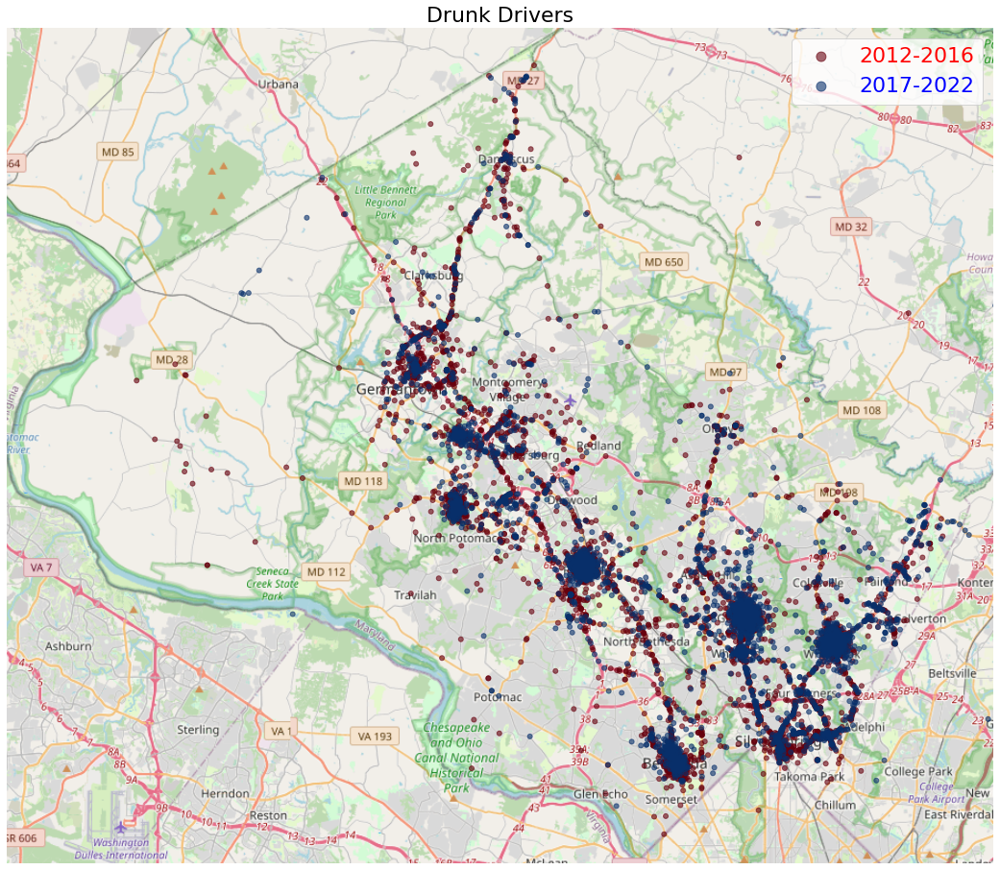

In [75]:

extent = (list(bound.geometry.bounds.values[0]))

ax = gplt.webmap(bound,
                 projection=gplt.crs.WebMercator(),
                 figsize=(24, 16),
                 extent=extent)

gplt.pointplot(
    ALCgtvg,
    ax=ax,
    extent=extent,
    hue="OldData",
    cmap='Reds_r',
    alpha=0.6,
    #cmap="Blues",
    #scheme="quantiles",
    #scale="ELEV_IN_FT",
    limits=(0.1, 0.5)
    #legend=False,
    #legend_var="scale",
    #legend_kwargs={"frameon": False},
    #legend_values=[-110, 1750, 3600, 5500, 7400],
    #legend_labels=["-110 feet", "1750 feet", "3600 feet", "5500 feet", "7400 feet"]
)

gplt.pointplot(
    ALCgmvg,
    ax=ax,
    extent=extent,
    hue="OldData",
    alpha=0.6,
    cmap="Blues_r",
    #scheme="quantiles",
    #scale="ELEV_IN_FT",
    limits=(0.1, 0.5)
    #legend=False,
    #legend_var="scale",
    #legend_kwargs={"frameon": False},
    #legend_values=[-110, 1750, 3600, 5500, 7400],
    #legend_labels=["-110 feet", "1750 feet", "3600 feet", "5500 feet", "7400 feet"]
)

ax.legend(["2012-2016","2017-2022"],fontsize=22,labelcolor=["red","blue"],markerscale=2)
ax.set_title("Drunk Drivers", fontsize=22)

In [32]:
tvdaylist = []
mvdaylist = []
for i in range(1,8):
    tvdaylist.append(ALCtvg.select("*").where(F.col("WeekDay")==i))
    mvdaylist.append(ALCmvg.select("*").where(F.col("WeekDay")==i))

In [22]:
#FOR PRESENTATION GIF RENDERING, NOT USED FOR PROJECT 
import imageio

In [33]:
def maprender(i):
    days = ["Sunday","Monday","Tuesday","Wednesday","Thursday","Friday","Saturday"]

    extent = (list(bound.geometry.bounds.values[0]))

    ax = gplt.webmap(bound,
                     projection=gplt.crs.WebMercator(),
                     figsize=(24, 16),
                     extent=extent)
    
    render1 = geopandas.GeoDataFrame(tvdaylist[i].toPandas(), geometry=geopandas.points_from_xy(list(tvdaylist[i].select('Longitude').toPandas()['Longitude']), list(tvdaylist[i].select('Latitude').toPandas()['Latitude'])))
    render2 = geopandas.GeoDataFrame(mvdaylist[i].toPandas(), geometry=geopandas.points_from_xy(list(mvdaylist[i].select('Longitude').toPandas()['Longitude']), list(mvdaylist[i].select('Latitude').toPandas()['Latitude'])))

    gplt.pointplot(
        render1,
        ax=ax,
        extent=extent,
        hue="OldData",
        cmap='Reds_r',
        alpha=0.6,
        limits=(0.1, 0.5)

    )

    gplt.pointplot(
        render2,
        ax=ax,
        extent=extent,
        hue="OldData",
        alpha=0.6,
        cmap="Blues_r",
        limits=(0.1, 0.5)
    )

    ax.legend(["2012-2016","2017-2022"],fontsize=22,labelcolor=["red","blue"],markerscale=2)
    ax.set_title(days[i], fontsize=22)
    
    return ax
    
    

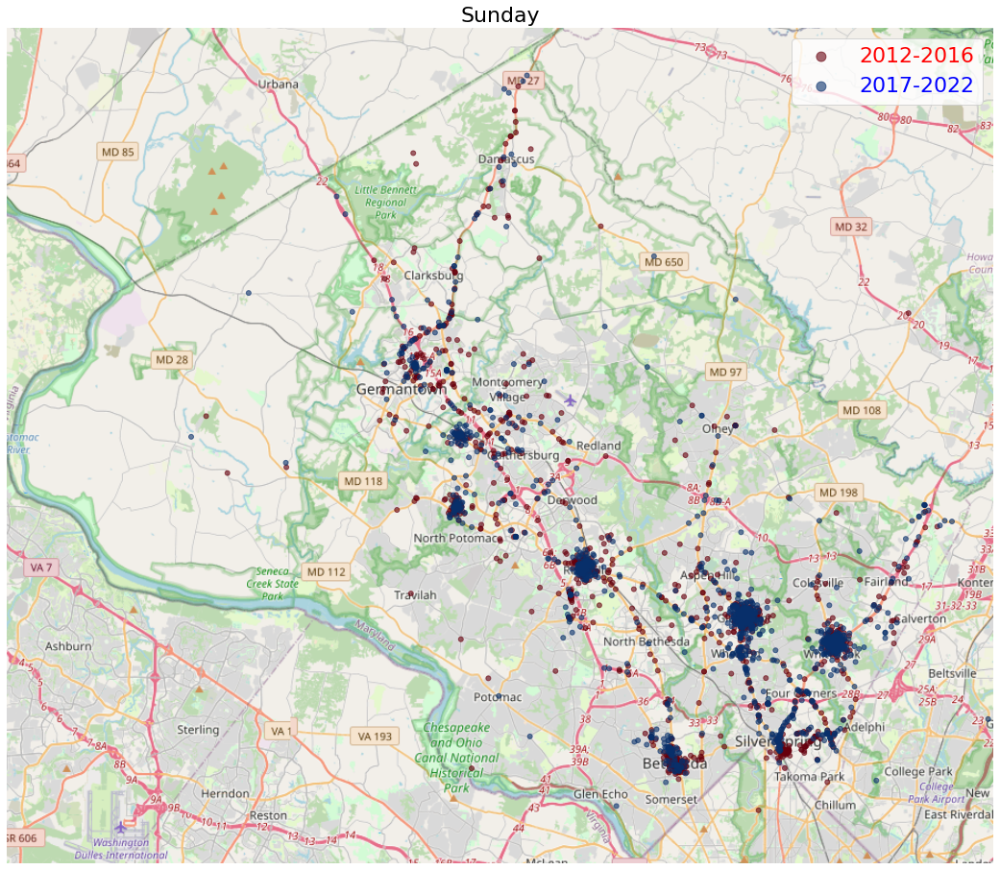

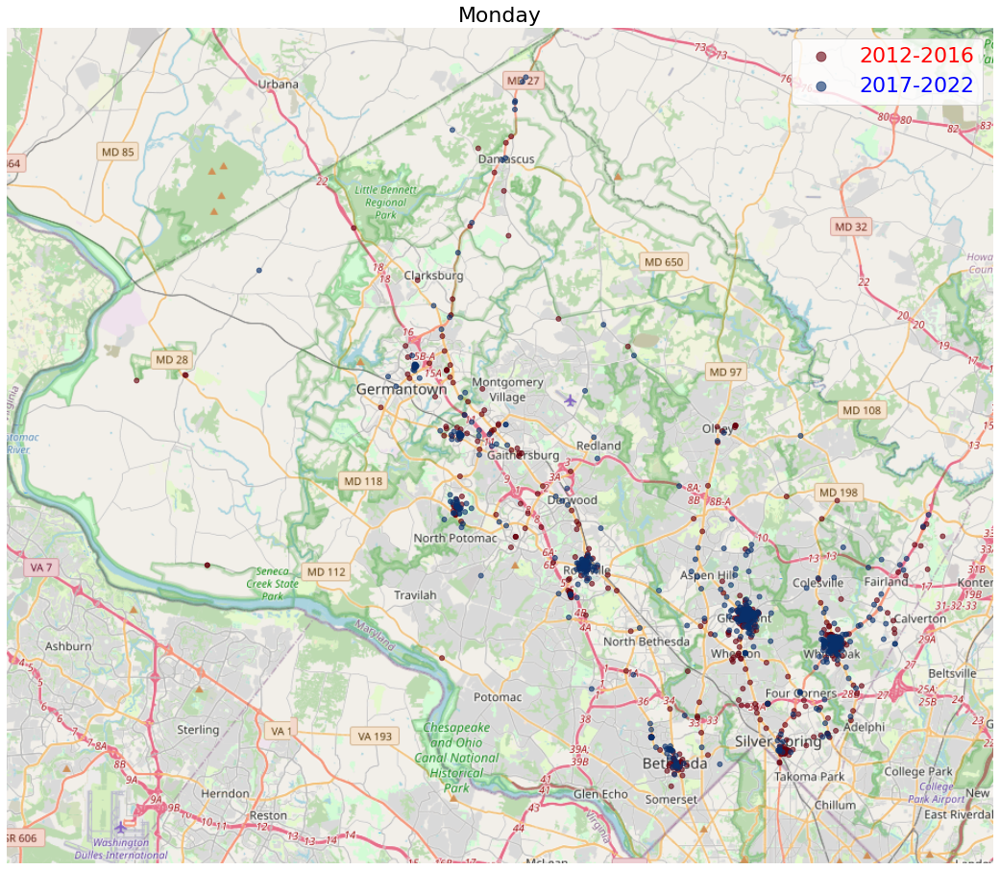

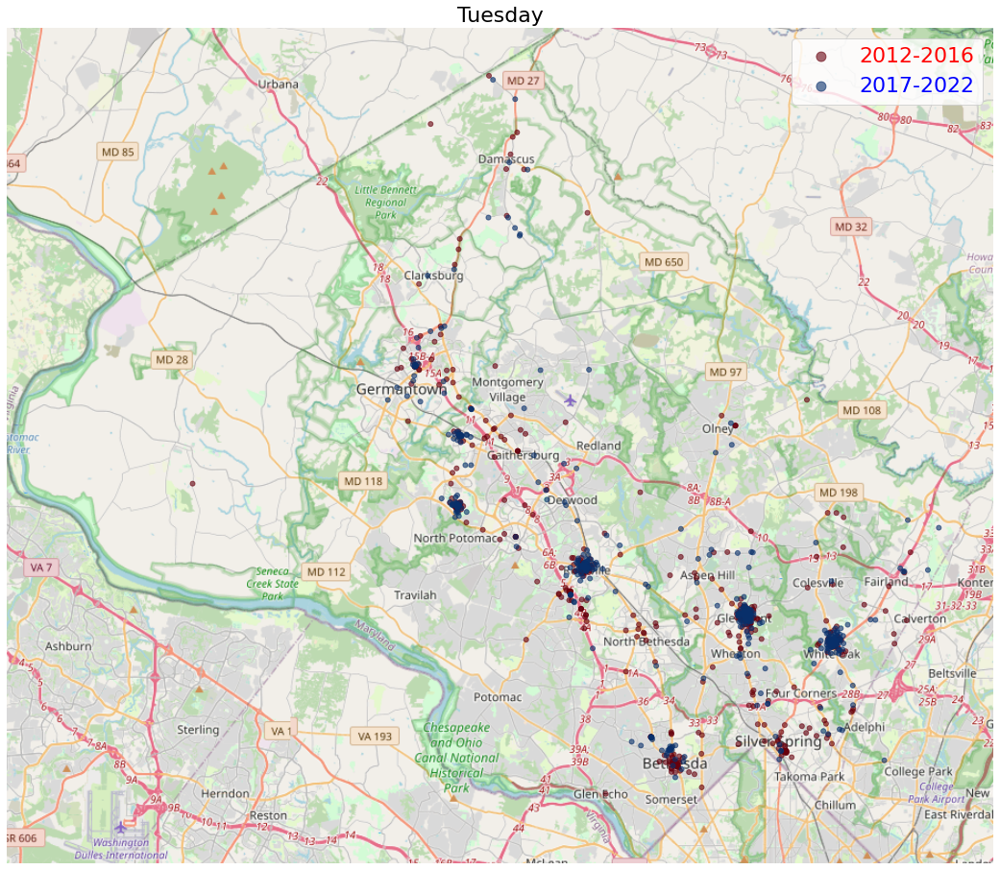

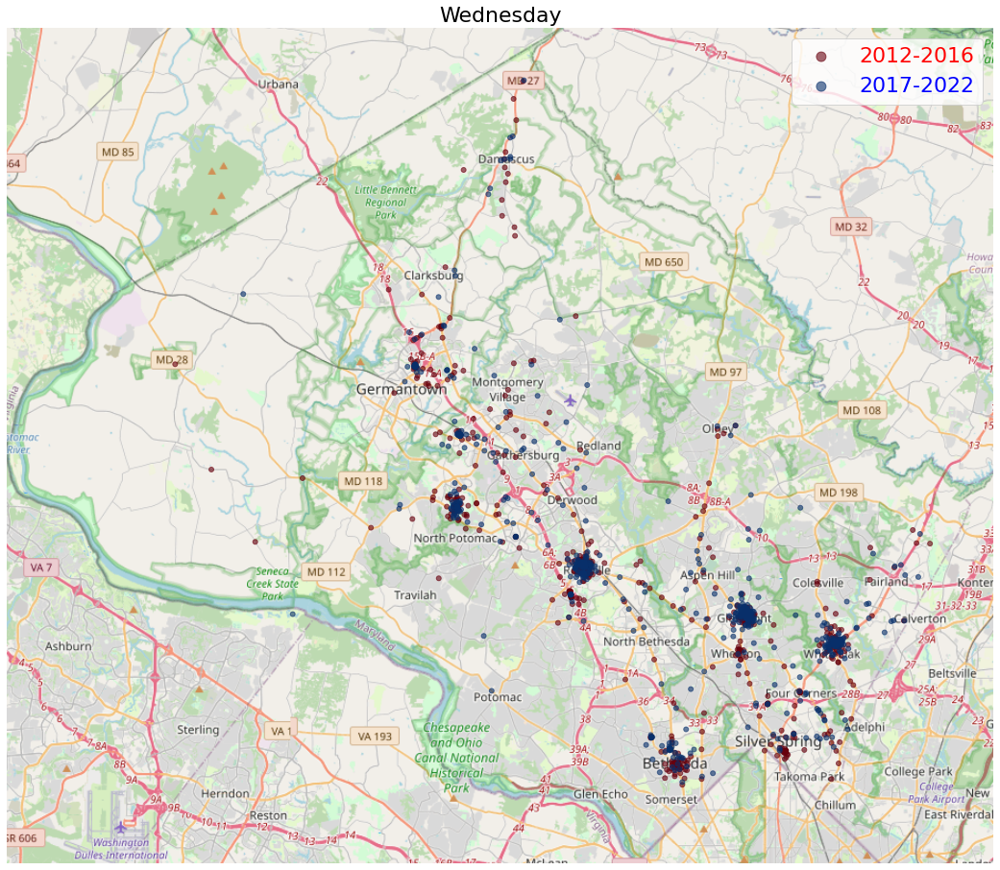

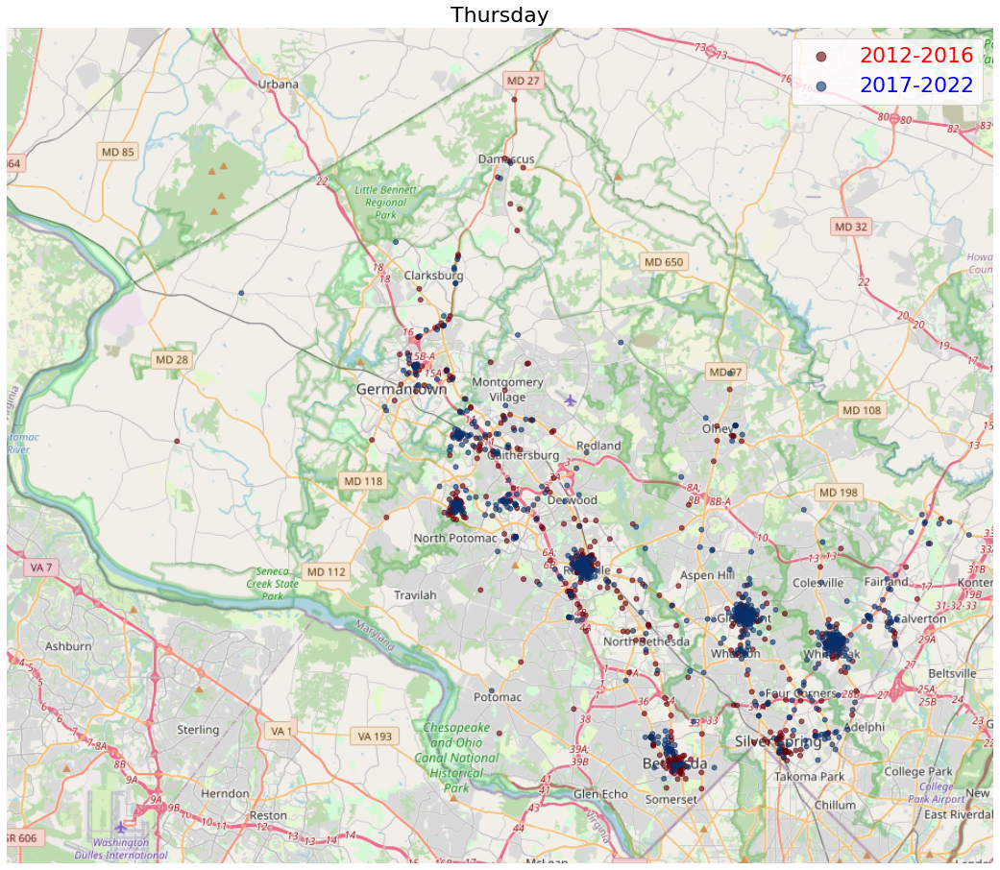

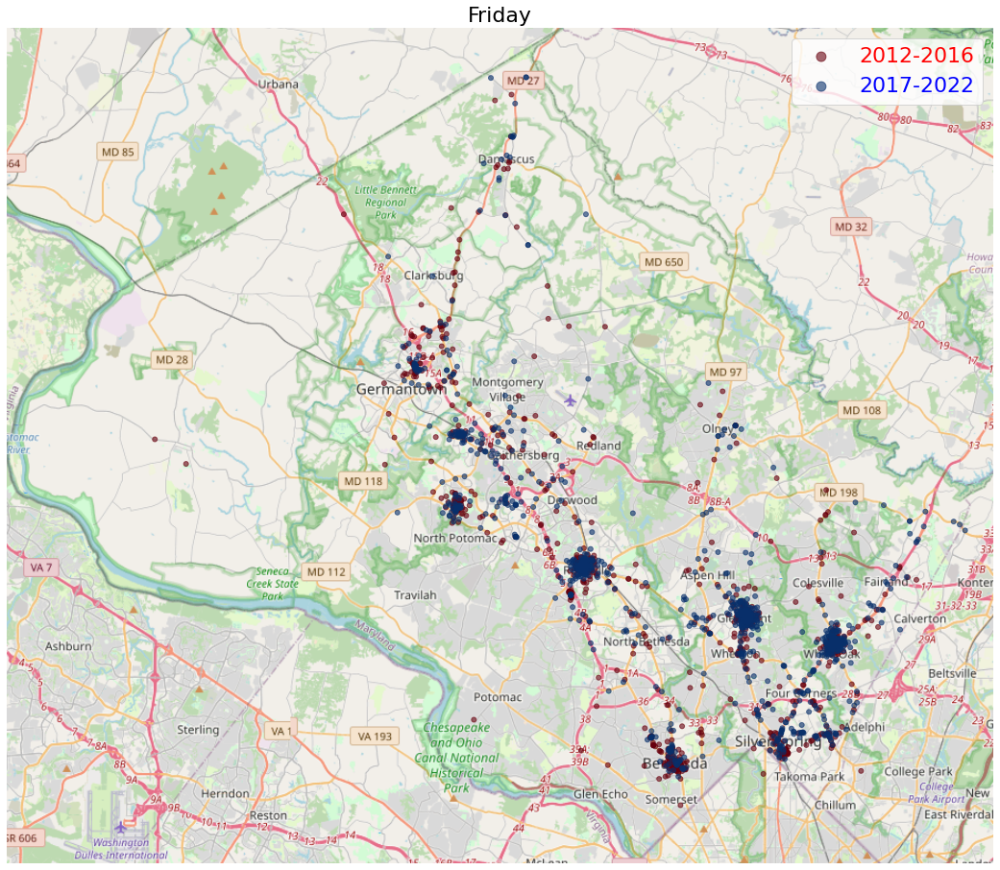

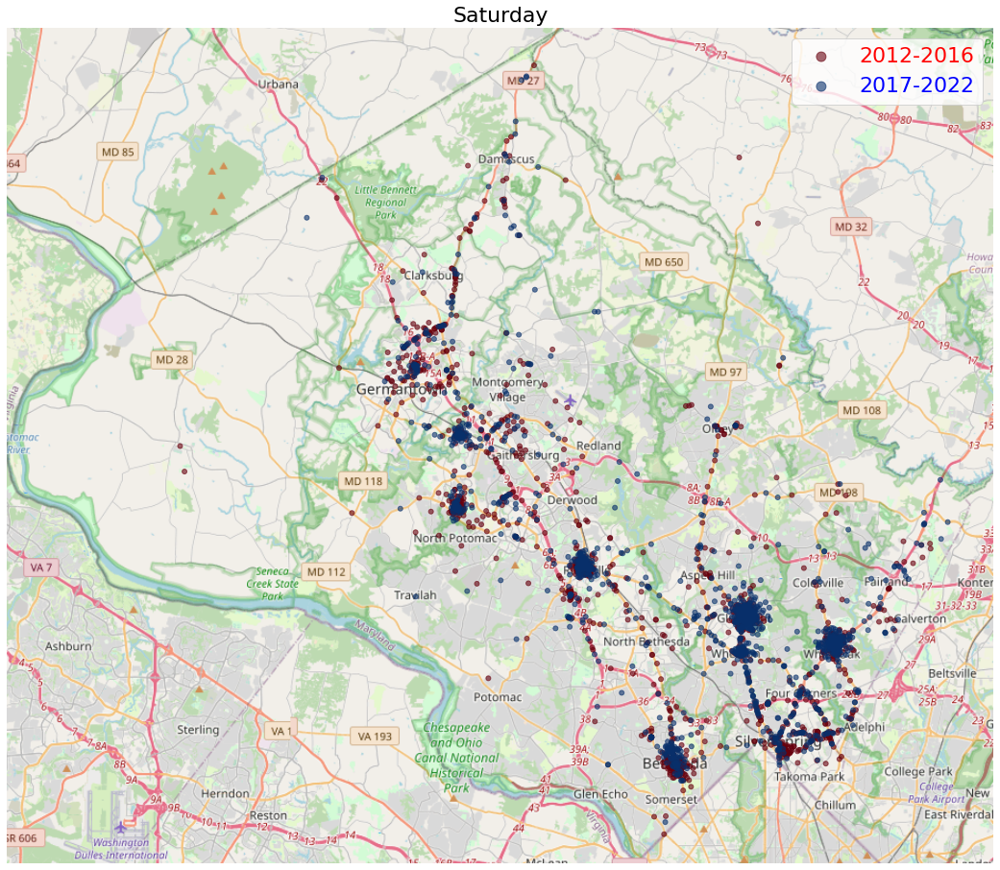

In [34]:
testrenders = []
for i in range(7):
    testrenders.append(maprender(i))

***
IMAGES SAVED FOR THE PROJECT, GIF GENERATED SEPARATELY
***

In [35]:
for i in range(7):
    (testrenders[i].get_figure().savefig("./ANIM/image{}".format(i)))

In [36]:
images = []
for i in range(7):
    images.append(imageio.imread("./ANIM/image{}.png".format(i)))

In [37]:
gif_path = "./ANIM/GIF.gif"
imageio.mimsave(gif_path, images, fps=0.5)


In [38]:
for i in range(7):
    testrenders[i].get_figure()

In [100]:
for i in range(len(tvdaylist)):
    print(i)

0
1
2
3
4
5
6


***
KMEANS CLUSTERING
***

In [45]:
from pyspark.ml.feature import VectorAssembler

#Feats not sensitive to normalization
vectorAssembler = VectorAssembler(inputCols=["Latitude", "Longitude"], handleInvalid="skip", outputCol="features")
kmeanstvg = vectorAssembler.transform(ALCtvg)
kmeanstvg.show()


+------+--------------------+--------------------+---------+----------+-----+--------------+--------------+-----+-----------------+------+--------+-----+---------------+----+----------+---------+----------+--------------+-----------+--------------------+-------+----+--------------+-------+--------------------+
|Agency|           SubAgency|            Location| Latitude| Longitude|Belts|PersonalInjury|PropertyDamage|Fatal|CommercialVehicle|HAZMAT|WorkZone|State|    VehicleType|Year|      Make|    Model|     Color|    DriverCity|DriverState|         Geolocation|WeekDay|Hour|AlcoholPresent|OldData|            features|
+------+--------------------+--------------------+---------+----------+-----+--------------+--------------+-----+-----------------+------+--------+-----+---------------+----+----------+---------+----------+--------------+-----------+--------------------+-------+----+--------------+-------+--------------------+
|   MCP|4th district, Whe...|GEORGIA AVENUE @ ...| 39.05949| -77

In [46]:
from pyspark.ml.clustering import KMeans

kmeans = KMeans(k=6, seed=1)
model = kmeans.fit(kmeanstvg.select('features'))


In [47]:
labeledkmeanstvg = model.transform(kmeanstvg)

In [48]:
labeledkmeanstvg.show()

+------+--------------------+--------------------+---------+----------+-----+--------------+--------------+-----+-----------------+------+--------+-----+---------------+----+----------+---------+----------+--------------+-----------+--------------------+-------+----+--------------+-------+--------------------+----------+
|Agency|           SubAgency|            Location| Latitude| Longitude|Belts|PersonalInjury|PropertyDamage|Fatal|CommercialVehicle|HAZMAT|WorkZone|State|    VehicleType|Year|      Make|    Model|     Color|    DriverCity|DriverState|         Geolocation|WeekDay|Hour|AlcoholPresent|OldData|            features|prediction|
+------+--------------------+--------------------+---------+----------+-----+--------------+--------------+-----+-----------------+------+--------+-----+---------------+----+----------+---------+----------+--------------+-----------+--------------------+-------+----+--------------+-------+--------------------+----------+
|   MCP|4th district, Whe...|GE

In [49]:
lkmtvg = geopandas.GeoDataFrame(labeledkmeanstvg.toPandas(), geometry=geopandas.points_from_xy(list(labeledkmeanstvg.select('Longitude').toPandas()['Longitude']), list(labeledkmeanstvg.select('Latitude').toPandas()['Latitude'])))

In [53]:
#l = labeledkmeanstvg.where(F.col('Prediction')==2)
#lkmtvg = geopandas.GeoDataFrame(l.toPandas(), geometry=geopandas.points_from_xy(list(l.select('Longitude').toPandas()['Longitude']), list(l.select('Latitude').toPandas()['Latitude'])))

<GeoAxesSubplot:>

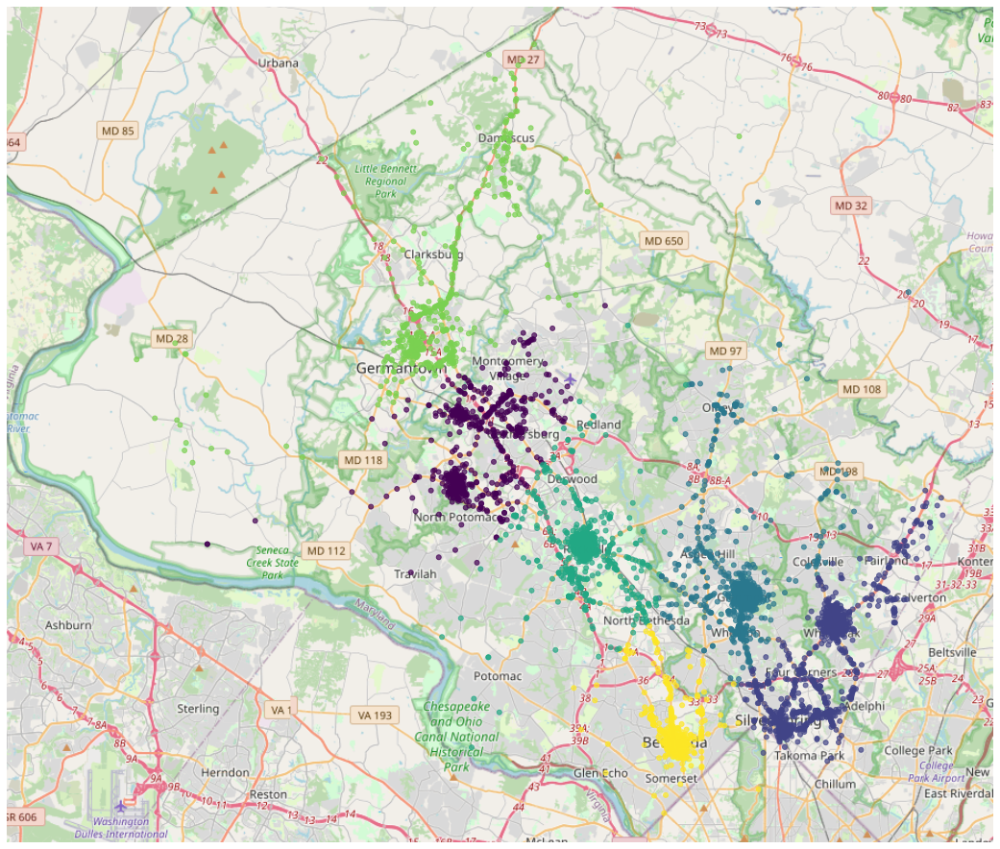

In [50]:
extent = (list(bound.geometry.bounds.values[0]))

ax = gplt.webmap(bound,
                 projection=gplt.crs.WebMercator(),
                 figsize=(24, 16),
                 extent=extent)

gplt.pointplot(
    lkmtvg,
    ax=ax,
    extent=extent,
    hue="prediction",
    alpha=0.7,
    #scheme="quantiles",
    #scale="ELEV_IN_FT",
    limits=(0.1, 0.5)
    #legend=False,
    #legend_var="scale",
    #legend_kwargs={"frameon": False},
    #legend_values=[-110, 1750, 3600, 5500, 7400],
    #legend_labels=["-110 feet", "1750 feet", "3600 feet", "5500 feet", "7400 feet"]
)